## Project Sections

1. [Data Collection](#data_collection)
2. [Business understanding](#business_understanding)
3. [Data annotation](#data_annotation)
4. [Data preparation](#data_preparation')
5. [EDA lifecycle](#eda_lifecycle)

### 1. Data collection <a id='data_collection'></a> 

# BDD100K Dataset: Data Collection and Source

The BDD100K dataset utilizes a crowd-sourced approach for data acquisition, leveraging the Nexar app, a dash cam application offering driving assistance features. Tens of thousands of drivers contributed by uploading videos through the app, resulting in a large and diverse dataset. This compilation includes 100,000 driving videos, each with a duration of 40 seconds. These videos originate from over 50,000 individual rides spanning various geographical regions, including New York, the San Francisco Bay Area, and other locations across the United States.

### Collected Data Overview:
- **High-resolution videos**: Each video is recorded at 720p resolution with a frame rate of 30fps.
- **GPS/IMU data**: The dataset includes GPS and Inertial Measurement Unit (IMU) data, allowing for the reconstruction and analysis of driving trajectories.


## BDD100K Dataset: Data Split

The BDD100K dataset is divided into three subsets for training, validation, and testing purposes:

- **Training set**: Comprises 70,000 video clips.
- **Validation set**: Contains 10,000 video clips.
- **Testing set**: Includes 20,000 video clips.

### Annotation Details:
- For **image-based tasks**, the **10th second frame** of each video clip is annotated.
- For **tracking tasks**, the complete video sequences are utilized.


#### BDD100K Dataset: Annotations Overview

The BDD100K dataset includes annotations focusing on three main categories:

- **Weather**: 
  - "rainy", "snowy", "clear", "overcast", "undefined", "partly cloudy", "foggy"

- **Scene**:
  - "tunnel", "residential", "parking lot", "undefined", "city street", "gas stations", "highway"

- **Time of Day**:
  - "daytime", "night", "dawn/dusk", "undefined"

#### Data location 
[Download BDD100K Dataset](https://dl.cv.ethz.ch/bdd100k/data/)

- #### Data organization structure <a id='data_org_structure'></a> 

#### BDD100K Dataset: Directory Structure

The BDD100K dataset follows the below directory structure:

- **`bdd100k/`**
    - **`images/`**
        - **`100k/`**
            - `train/`
            - `val/`
            - `test/`

#### BDD100K Dataset: Labels Directory Structure

The detection labels directory structure is as follows:

- **`bdd100k/`**
    - **`labels/`**
        - **`det_20/`**
            - `det_train.json`
            - `det_val.json`



- #### Meta Data understanding <a id='meta_data_understand'></a> 

##### BDD100K Dataset: Object Categories

The BDD100K dataset includes the following object categories:

1. Pedestrian
2. Rider
3. Car
4. Truck
5. Bus
6. Train
7. Motorcycle
8. Bicycle
9. Traffic Light
10. Traffic Sign

### 2. Business understanding <a id='business_understanding'></a> 

The goal of BDD100K Object Detection is to develop deep learning model capable of accurately detecting and localizing objects in real-world driving scenarios. By training on a large, diverse  dataset, we have to improve detections across varying weather, scene types, and time of day. 

### 3. Data annotation <a id='data_annotation'></a> 

The data in format of json is converted to **YOLO** 

#### Example

```
2 0.2344 0.3472 0.0781 0.0694

```
Where:
- **`2`** is the class ID for "car".
- **`0.2344`** is `300 / 1280` (center_x normalized).
- **`0.3472`** is `250 / 720` (center_y normalized).
- **`0.0781`** is `100 / 1280` (width normalized).
- **`0.0694`** is `50 / 720` (height normalized).

### 4. Data preparation<a id='data_preparation'></a> 

Train and val jsons are downloaded and converted into YOLO format where each .txt file contains annotation for single image and each line in the file contains details about annotation in normalized format.

A yaml file is created which contains path of the train,val data and classes in dataset.

```
yaml_data = {
            'path': str(root_path),  # Dataset root path
            'train': relative_train_path,  # Path to training images
            'val': relative_val_path,  # Path to validation images
            'test': None,  # Optional, as there's no test set defined
            'names': self.idx_to_label  # Class name mapping (from idx_to_label)
        }
```

### 5. EDA lifecycle <a id='eda_lifecycle'></a> 

Add the project to python path

In [1]:
!uv pip install ipykernel

Using Python 3.10.14 environment at: /home/jl_fs/bdd100k_detector/.venv
Audited 1 package in 12ms


In [37]:
import os
import sys
current_dir = os.getcwd()
sys.path.append(os.path.join(os.path.dirname(current_dir),'src'))
sys.path.append(os.path.dirname(current_dir))
from dotenv import load_dotenv

In [38]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


Import necessary packages

In [39]:
from pathlib import Path
import plotly.express as px
import pandas as pd
import torch
import matplotlib.pyplot as plt
import nbformat
import seaborn as sns
from torchvision.io import decode_image
from torchvision.utils import draw_bounding_boxes
from src.bdd_data_analysis.data_analyzer import BDD100KEDA
from src.bdd_utils import file_utils, data_utils, model_utils, image_utils
load_dotenv()

True

In [40]:
images_save_path = os.environ.get('IMAGES_SAVE_PATH',os.path.abspath('../reports/figures'))
project_location = os.environ.get('PROJECT_ROOT',os.path.abspath('../'))
data_config = os.environ.get('DATA_CONFIG_PATH')

Create a EDA entity to perform data analysis on BDD100K dataset

In [41]:
num_samples = -1
eda_entity = BDD100KEDA(data_config,output_path=images_save_path,num_samples=num_samples)

{'train_label': '/home/jl_fs/bdd100k_detector/data/inter/det_20/det_train.json', 'val_label': '/home/jl_fs/bdd100k_detector/data/inter/det_20/det_val.json', 'train_images': '/home/jl_fs/bdd100k_detector/data/raw/bdd100k/images/100k/train', 'val_images': '/home/jl_fs/bdd100k_detector/data/raw/bdd100k/images/100k/val', 'train_csv': '/home/jl_fs/bdd100k_detector/data/processed/bdd100k/train.csv', 'val_csv': '/home/jl_fs/bdd100k_detector/data/processed/bdd100k/val.csv'}


/home/jl_fs/bdd100k_detector/src/bdd_data_analysis/data_analyzer.py:137: DtypeWarning:

Columns (7,8) have mixed types. Specify dtype option on import or set low_memory=False.



Convert the BDD100K json to pandas dataframe for easier data analysis

In [42]:
train_df,val_df = eda_entity.get_dataframes()

Get the count of each category and their percentage in dataset. 

In [19]:
category_counts = val_df['category'].value_counts()

# Step 2: Calculate the percentage of samples for each category
total_samples = len(val_df)
category_percentage = (category_counts / total_samples) * 100

# Step 3: Create a new DataFrame with 'category', 'number of samples' and 'percentage'
summary_df = pd.DataFrame({
    'category': category_counts.index,
    'number_of_samples': category_counts.values,
    'percentage_of_samples': category_percentage.values
})

# Optional: Sort by number of samples or percentage (descending)
summary_df = summary_df.sort_values(by='number_of_samples', ascending=False).reset_index(drop=True)
summary_df

,category,number_of_samples,percentage_of_samples
0,car,102837,55.278902
1,traffic sign,34724,18.665506
2,traffic light,26884,14.451200
3,pedestrian,13425,7.216462
4,truck,4243,2.280778
5,bus,1660,0.892315
6,bicycle,1039,0.558503
7,rider,658,0.353701
8,motorcycle,460,0.247268
9,other vehicle,85,0.045691


Based on the analysis **Car** and **traffic sign** are two classes which appear more frequently

In [20]:
val_df.head(5)

,image_id,weather,timeofday,scene,timestamp,category,traffic_light_color,occluded,truncated,bbox_x1,bbox_y1,bbox_x2,bbox_y2,split,image_path,img_width,img_height
0,b1c66a42-6f7d68ca.jpg,overcast,daytime,city street,10000,traffic sign,NaN,False,False,1000.698742,281.992415,1040.626872,326.911560,val,/home/jl_fs/bdd100k_detector/data/raw/bdd100k/...,1280,720
1,b1c66a42-6f7d68ca.jpg,overcast,daytime,city street,10000,traffic sign,NaN,False,False,214.613695,172.190058,274.505889,229.586743,val,/home/jl_fs/bdd100k_detector/data/raw/bdd100k/...,1280,720
2,b1c66a42-6f7d68ca.jpg,overcast,daytime,city street,10000,traffic sign,NaN,False,False,797.314833,313.186265,829.756437,341.884608,val,/home/jl_fs/bdd100k_detector/data/raw/bdd100k/...,1280,720
3,b1c66a42-6f7d68ca.jpg,overcast,daytime,city street,10000,traffic sign,NaN,False,False,652.575363,303.204232,685.016968,315.681772,val,/home/jl_fs/bdd100k_detector/data/raw/bdd100k/...,1280,720
4,b1c66a42-6f7d68ca.jpg,overcast,daytime,city street,10000,traffic light,G,False,False,707.476543,311.938510,716.210821,328.159313,val,/home/jl_fs/bdd100k_detector/data/raw/bdd100k/...,1280,720


In [21]:
def display_bbox_intensity(df, splits=['train', 'val']):
    plt.figure(figsize=(10, 6))

    # Loop through each split and plot its bounding box density
    for split in splits:
        # Filter the dataframe based on the split
        split_df = df[df['split'] == split].copy()  # Use .copy() to avoid modifying the original DataFrame
        
        # Calculate bbox_area using .loc to avoid SettingWithCopyWarning
        split_df.loc[:, 'bbox_area'] = (split_df['bbox_x2'] - split_df['bbox_x1']) * (split_df['bbox_y2'] - split_df['bbox_y1'])
        
        # Calculate image density for the current split
        image_density = split_df.groupby('image_id').size()

        # Plot bounding box density for the current split using KDE
        sns.kdeplot(image_density, label=split, fill=True, alpha=0.5, color='lightcoral' if split == 'train' else 'lightblue')

    plt.title('Bounding Box Density Distribution per Image (KDE)')
    plt.xlabel('Bounding Boxes per Image')
    plt.ylabel('Density')
    plt.legend(title='Split')
    plt.show()

def display_bbox_intensity_hist(df, splits=['train', 'val']):
    plt.figure(figsize=(10, 6))

    # Loop through each split and plot its bounding box density
    for split in splits:
        # Filter the dataframe based on the split
        split_df = df[df['split'] == split]
        split_df['bbox_area'] = (split_df['bbox_x2'] - split_df['bbox_x1']) * (split_df['bbox_y2'] - split_df['bbox_y1'])
        
        # Calculate image density for the current split
        image_density = split_df.groupby('image_id').size()

        # Plot bounding box density for the current split
        image_density.plot(kind='hist', bins=30, alpha=0.5, label=split, color='lightcoral' if split == 'train' else 'lightblue')

    plt.title('Bounding Box Density Distribution per Image')
    plt.xlabel('Bounding Boxes per Image')
    plt.ylabel('Frequency')
    plt.legend(title='Split')
    plt.show()

Display the intensity of number of annotations per image in both train and val data

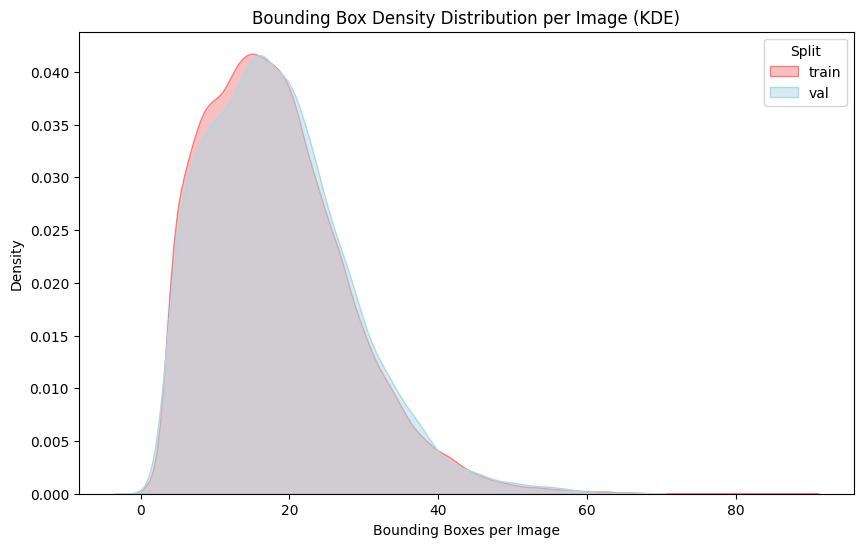

/tmp/ipykernel_10984/1569490107.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  split_df['bbox_area'] = (split_df['bbox_x2'] - split_df['bbox_x1']) * (split_df['bbox_y2'] - split_df['bbox_y1'])
/tmp/ipykernel_10984/1569490107.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  split_df['bbox_area'] = (split_df['bbox_x2'] - split_df['bbox_x1']) * (split_df['bbox_y2'] - split_df['bbox_y1'])


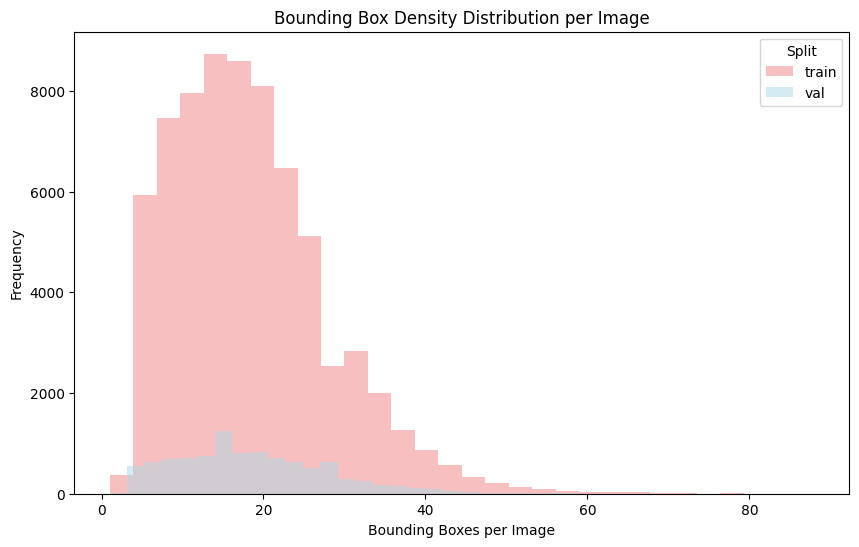

In [22]:
display_bbox_intensity(eda_entity.df_train_val)
display_bbox_intensity_hist(eda_entity.df_train_val)

Based on the above plot, both train and val follows the similar distribution

Plot the distribution of different type of scene in trian and val set

In [23]:
eda_entity.plot_scene_distribution(eda_entity.df_train_val)

Both the train and val follows similar pattern where **city street** scene covers 60 percent of total scences and there are new samples where scence is undefined

In [24]:
eda_entity.plot_weather_distribution(eda_entity.df_train_val)

In [25]:
eda_entity.plot_time_distribution(eda_entity.df_train_val)

In [26]:
eda_entity.plot_category_distribution(eda_entity.df_train_val)

Plot co-occurence of particular category and scence

In [36]:
eda_entity.plot_cooccurrence_heatmap(eda_entity.train_df, 'category','scene',title='category and scene in train')
eda_entity.plot_cooccurrence_heatmap(eda_entity.val_df, 'category','scene',title='category and scene in val set')

/home/jl_fs/bdd100k_detector/src/bdd_data_analysis/data_analyzer.py:446: FutureWarning:

DataFrame.applymap has been deprecated. Use DataFrame.map instead.



/home/jl_fs/bdd100k_detector/src/bdd_data_analysis/data_analyzer.py:446: FutureWarning:

DataFrame.applymap has been deprecated. Use DataFrame.map instead.



Its observed that most classes occur in city street where as train appears in equal proportion at city street and highway in train set

In [28]:
eda_entity.plot_column_distribution(eda_entity.df_train_val,'traffic_light_color')

In [29]:
eda_entity.df_train_val['bbox_area'] = (eda_entity.df_train_val['bbox_x2'] - eda_entity.df_train_val['bbox_x1']) * (eda_entity.df_train_val['bbox_y2'] - eda_entity.df_train_val['bbox_y1'])
area_stats = eda_entity.df_train_val.groupby('category')['bbox_area'].agg(['min', 'max', 'mean'])
# fig = px.bar(area_stats.reset_index(), 
#                      x='category', 
#                      y=['min', 'max', 'mean'], 
#                      barmode='group', 
#                      labels={'category': 'Category', 'value': 'Bounding Box Area'}, 
#                      title='Category-wise Bounding Box Area Statistics')
# fig.show()
area_stats

,min,max,mean
category,,,
bicycle,3.746541,273027.062523,5928.661615
bus,28.950549,775744.234894,34714.059301
car,3.983593,630550.452161,9608.217996
motorcycle,19.825516,205118.162110,7765.545474
other person,82.395339,30211.079480,2326.926581
other vehicle,91.096602,367415.646305,29966.425236
pedestrian,3.330268,331486.897544,2892.012460
rider,12.983414,249593.160009,6226.092693
traffic light,1.498615,302654.309631,477.660582


Based on the annotation area occupied, we can find the traffic light and traffic sign are two classes where the annotation of objects are smaller compared to other classes

In [30]:
eda_entity.plot_occlusion_truncation_by_category_percent(eda_entity.df_train_val)

In [31]:
eda_entity.plot_multi_attribute_distribution(val_df,category_column='category',attribute_col_1='weather',attribute_col_2='timeofday')

/home/jl_fs/bdd100k_detector/src/bdd_data_analysis/data_analyzer.py:597: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/home/jl_fs/bdd100k_detector/src/bdd_data_analysis/data_analyzer.py:601: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



Sample image annotations

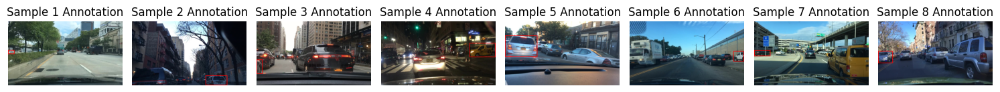

In [46]:
conditions = {'category': 'car', 'truncated': True}
image_utils.display_bounding_box_for_sample(val_df, conditions)

### Samples where car is both truncated and occluded

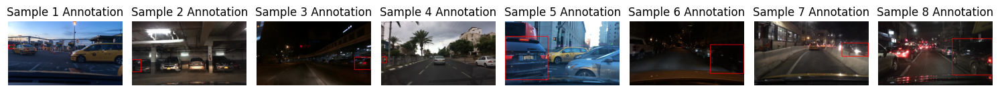

In [47]:
conditions = {'category': 'car', 'truncated': True, 'occluded':True}
image_utils.display_bounding_box_for_sample(val_df, conditions)

### Samples from train class

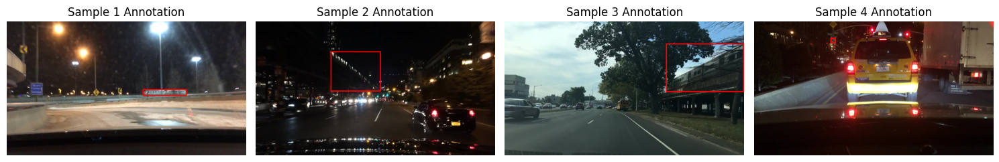

In [48]:
conditions = {'category': 'train'}
image_utils.display_bounding_box_for_sample(val_df, conditions, num_samples=4)

### Traffic sign occlusion

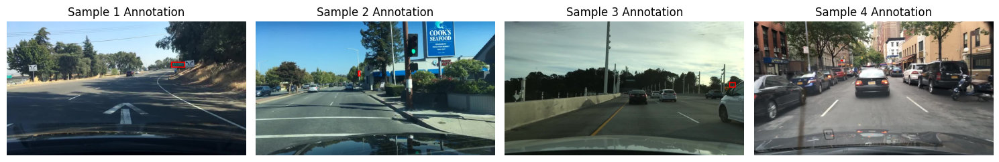

In [49]:
conditions = {'category': 'traffic sign','occluded':True}
image_utils.display_bounding_box_for_sample(val_df, conditions, num_samples=4)

## Cases where both itime nd scene is not defined

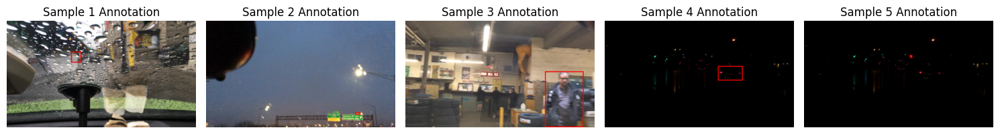

In [51]:
conditions = {'scene': 'undefined','timeofday':'undefined'}
image_utils.display_bounding_box_for_sample(val_df, conditions, num_samples=5)

## Samples from category - other vehicle

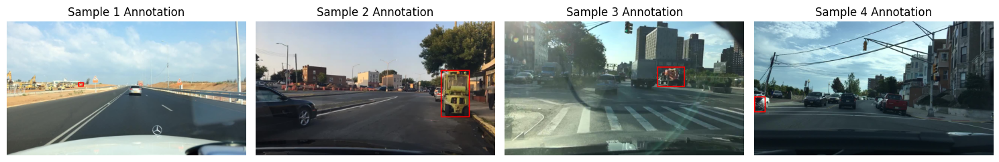

In [52]:
conditions = {'category': 'other vehicle'}
image_utils.display_bounding_box_for_sample(val_df, conditions, num_samples=4)

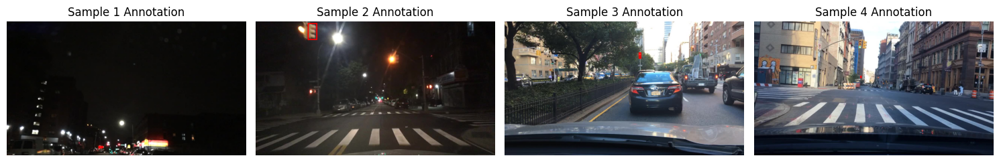

In [53]:
conditions = {'weather': 'undefined','traffic_light_color':'R'}
image_utils.display_bounding_box_for_sample(val_df, conditions, num_samples=4)

## Get the min box area, max box area per class

In [54]:
min_max_df = data_utils.get_min_max_rows(train_df, category_col='category')
min_max_df.head(5)

,image_id,weather,timeofday,scene,timestamp,category,traffic_light_color,occluded,truncated,bbox_x1,bbox_y1,bbox_x2,bbox_y2,split,image_path,img_width,img_height,bbox_area,area_type
0,997bc41e-0b3b46f8.jpg,overcast,daytime,city street,10000,bicycle,NaN,True,False,590.123395,227.981455,596.244304,228.593544,train,/home/jl_fs/bdd100k_detector/data/raw/bdd100k/...,1280,720,3.746541,min
1,1f8f289b-3ae59c8a.jpg,clear,night,city street,10000,bus,NaN,False,False,610.957058,493.653720,619.743496,496.948633,train,/home/jl_fs/bdd100k_detector/data/raw/bdd100k/...,1280,720,28.950549,min
2,af56b127-620c0973.jpg,clear,night,highway,10000,car,NaN,True,False,323.350385,566.194524,324.015683,572.182206,train,/home/jl_fs/bdd100k_detector/data/raw/bdd100k/...,1280,720,3.983593,min
3,8a7f5222-0fd844dd.jpg,overcast,daytime,city street,10000,motorcycle,NaN,False,False,376.773082,307.080441,380.173800,312.910244,train,/home/jl_fs/bdd100k_detector/data/raw/bdd100k/...,1280,720,19.825516,min
4,997bd42e-39a7d09d.jpg,overcast,daytime,city street,10000,other person,NaN,True,False,606.787521,558.993811,614.124734,570.223598,train,/home/jl_fs/bdd100k_detector/data/raw/bdd100k/...,1280,720,82.395339,min


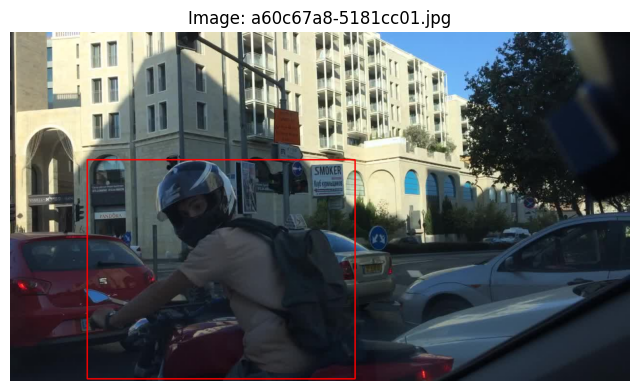

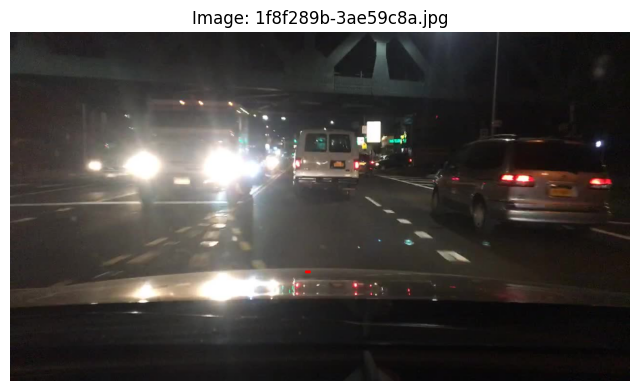

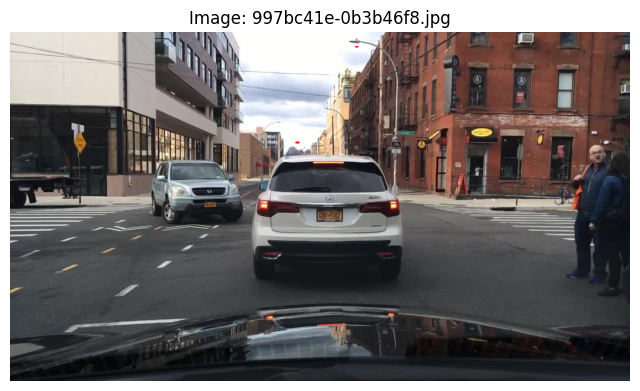

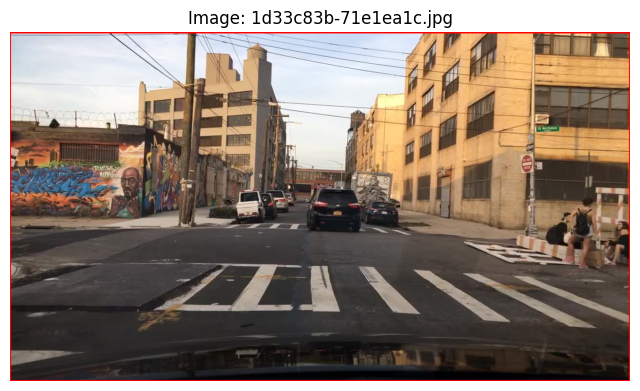

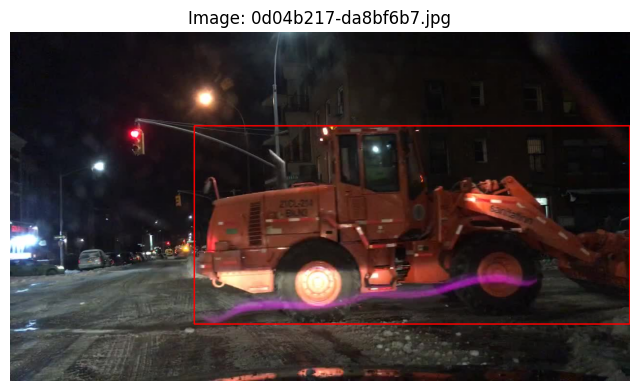

...

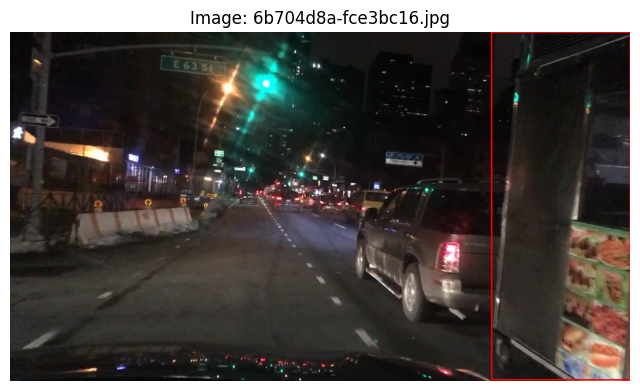

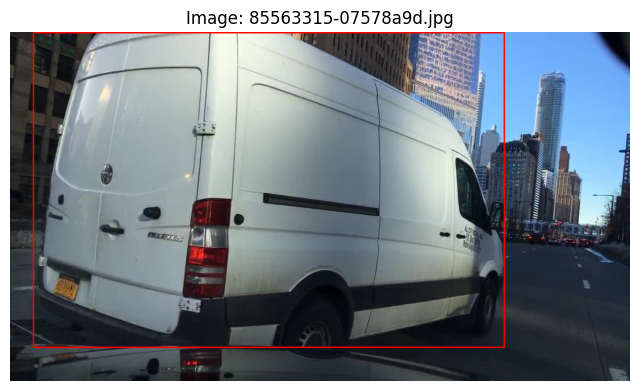

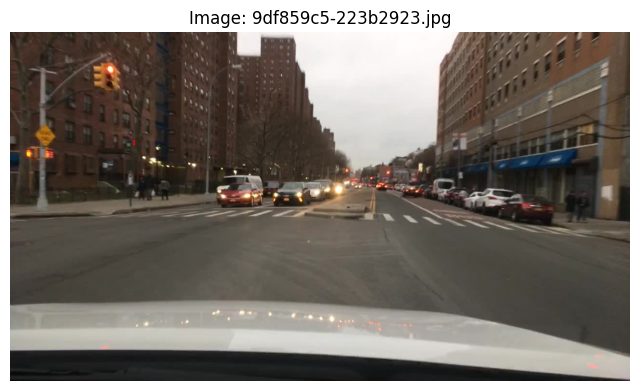

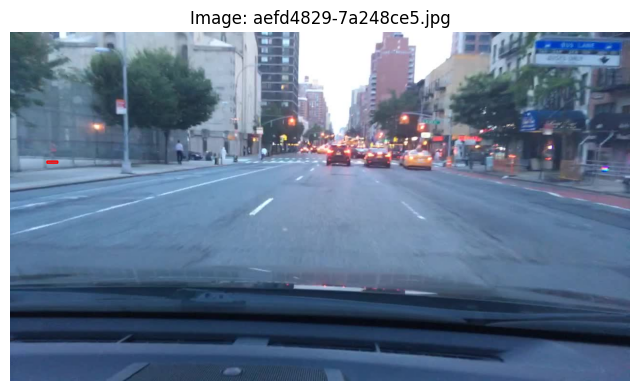

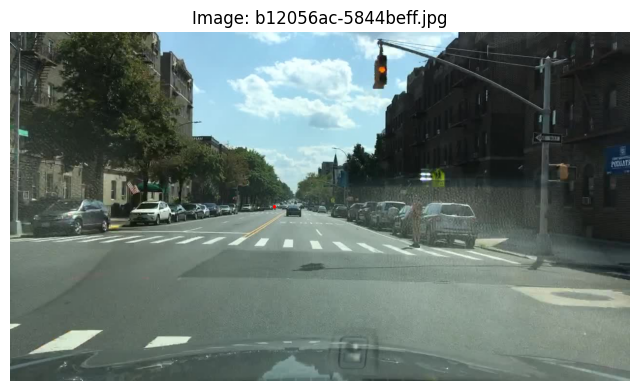

In [55]:
image_utils.display_bounding_boxes(min_max_df,image_wise=True)

Sample images in train without ground truth labels

10 images do not have any labels/ground truth


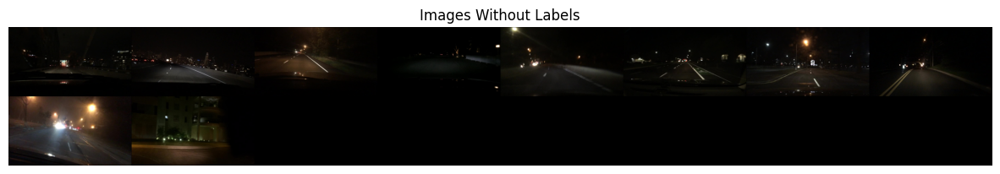

In [35]:
eda_entity.plot_image_without_labels(eda_entity.df_train_val,images_root_path='/home/jl_fs/bdd100k_detector/data/raw/bdd100k/images/100k/train')

### Conclusion

Based on the Data analysis

- category car is high in number
- category train, bus is under represented.
- The data is captured mostly in city street
- There were around 10 samples in train set without any labels
- There were few objects where are occluded/truncated, very small which might hamper the performance of the model